# LLVIP Dataset -- Exploratory Data Analysis

**LLVIP** (Low-Light Visible-Infrared Paired) dataset:
- 15,488 pairs (visible + infrared), 1280x1024
- Train: 12,025 pairs | Test: 3,463 pairs
- VOC XML annotations, class: person
- Source: https://github.com/bupt-ai-cz/LLVIP

Trong project nay, LLVIP duoc dung de pretrain **Thermal backbone** cho mid-level fusion pipeline.

## 1. Setup

In [1]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from pathlib import Path
from collections import Counter

# Duong dan dataset
# Colab: mount Google Drive hoac gdown
# Local: chi duong dan truc tiep
LLVIP_DIR = '../RGB-T/data/LLVIP'  # <-- Doi neu chay tren Colab

VIS_TRAIN = os.path.join(LLVIP_DIR, 'visible', 'train')
VIS_TEST  = os.path.join(LLVIP_DIR, 'visible', 'test')
IR_TRAIN  = os.path.join(LLVIP_DIR, 'infrared', 'train')
IR_TEST   = os.path.join(LLVIP_DIR, 'infrared', 'test')
ANN_DIR   = os.path.join(LLVIP_DIR, 'Annotations')

print(f'Visible train:  {len(os.listdir(VIS_TRAIN))} images')
print(f'Visible test:   {len(os.listdir(VIS_TEST))} images')
print(f'Infrared train: {len(os.listdir(IR_TRAIN))} images')
print(f'Infrared test:  {len(os.listdir(IR_TEST))} images')
print(f'Annotations:    {len(os.listdir(ANN_DIR))} XML files')

Visible train:  12025 images
Visible test:   3463 images
Infrared train: 12025 images
Infrared test:  3463 images
Annotations:    15488 XML files


## 2. Parse Annotations

In [2]:
def parse_voc_xml(xml_path):
    """Parse VOC XML -> list of dicts with bbox info."""
    tree = ET.parse(xml_path)
    root = tree.getroot()
    size = root.find('size')
    img_w = int(size.find('width').text)
    img_h = int(size.find('height').text)
    objects = []
    for obj in root.findall('object'):
        cls = obj.find('name').text.lower()
        diff = int(obj.find('difficult').text) if obj.find('difficult') is not None else 0
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        objects.append({
            'class': cls,
            'difficult': diff,
            'xmin': xmin, 'ymin': ymin, 'xmax': xmax, 'ymax': ymax,
            'bbox_w': xmax - xmin, 'bbox_h': ymax - ymin,
            'img_w': img_w, 'img_h': img_h
        })
    return objects


# Xac dinh train/test split dua tren ten file
train_stems = {Path(f).stem for f in os.listdir(IR_TRAIN)}
test_stems  = {Path(f).stem for f in os.listdir(IR_TEST)}

rows = []
for xml_file in sorted(Path(ANN_DIR).glob('*.xml')):
    stem = xml_file.stem
    if stem in train_stems:
        split = 'train'
    elif stem in test_stems:
        split = 'test'
    else:
        split = 'unknown'

    try:
        objs = parse_voc_xml(xml_file)
    except Exception as e:
        print(f'Error parsing {xml_file}: {e}')
        continue

    if not objs:
        rows.append({
            'stem': stem, 'split': split, 'class': 'none',
            'difficult': 0, 'xmin': 0, 'ymin': 0, 'xmax': 0, 'ymax': 0,
            'bbox_w': 0, 'bbox_h': 0, 'img_w': 1280, 'img_h': 1024
        })
    else:
        for o in objs:
            o['stem'] = stem
            o['split'] = split
            rows.append(o)

df = pd.DataFrame(rows)
print(f'Total rows: {len(df)}')
print(f'\nClasses: {df["class"].unique()}')
print(f'\nPer split:')
print(df.groupby(['split', 'class']).size())

Total rows: 42439

Classes: ['person' 'none']

Per split:
split  class 
test   person     8302
train  none          2
       person    34135
dtype: int64


## 3. Dataset Overview

In [3]:
df_person = df[df['class'] == 'person'].copy()

n_train_imgs = df_person[df_person['split'] == 'train']['stem'].nunique()
n_test_imgs  = df_person[df_person['split'] == 'test']['stem'].nunique()
n_train_boxes = len(df_person[df_person['split'] == 'train'])
n_test_boxes  = len(df_person[df_person['split'] == 'test'])

# Anh khong co annotation
all_ann_stems = {Path(f).stem for f in os.listdir(ANN_DIR)}
no_ann_train = train_stems - all_ann_stems
no_ann_test  = test_stems - all_ann_stems

print('=' * 50)
print('LLVIP Dataset Summary')
print('=' * 50)
print(f'Image size:          1280 x 1024')
print(f'Total pairs:         {len(train_stems) + len(test_stems)}')
print(f'  Train pairs:       {len(train_stems)}')
print(f'  Test pairs:        {len(test_stems)}')
print(f'Annotated images:    {len(all_ann_stems)}')
print(f'  Train w/ person:   {n_train_imgs} imgs, {n_train_boxes} boxes')
print(f'  Test  w/ person:   {n_test_imgs} imgs, {n_test_boxes} boxes')
print(f'  No annotation:     train={len(no_ann_train)}, test={len(no_ann_test)}')
print(f'Avg persons/image:   {len(df_person) / df_person["stem"].nunique():.2f}')

LLVIP Dataset Summary
Image size:          1280 x 1024
Total pairs:         15488
  Train pairs:       12025
  Test pairs:        3463
Annotated images:    15488
  Train w/ person:   12023 imgs, 34135 boxes
  Test  w/ person:   3463 imgs, 8302 boxes
  No annotation:     train=0, test=0
Avg persons/image:   2.74


## 4. Persons Per Image Distribution

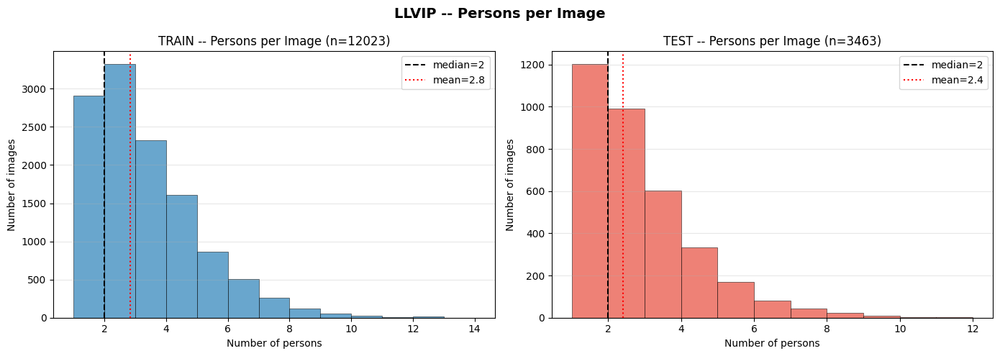


Persons per image stats:
         count  mean   std  min  25%  50%  75%   max
split                                               
test    3463.0  2.40  1.54  1.0  1.0  2.0  3.0  11.0
train  12023.0  2.84  1.74  1.0  2.0  2.0  4.0  13.0


In [4]:
persons_per_img = df_person.groupby(['split', 'stem']).size().reset_index(name='count')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, split in zip(axes, ['train', 'test']):
    data = persons_per_img[persons_per_img['split'] == split]['count']
    ax.hist(data, bins=range(1, data.max() + 2), alpha=0.7,
            color='#2980b9' if split == 'train' else '#e74c3c',
            edgecolor='black', linewidth=0.5)
    ax.set_title(f'{split.upper()} -- Persons per Image (n={len(data)})', fontsize=12)
    ax.set_xlabel('Number of persons')
    ax.set_ylabel('Number of images')
    ax.axvline(data.median(), color='black', linestyle='--', linewidth=1.5,
               label=f'median={data.median():.0f}')
    ax.axvline(data.mean(), color='red', linestyle=':', linewidth=1.5,
               label=f'mean={data.mean():.1f}')
    ax.legend()
    ax.grid(axis='y', alpha=0.3)

plt.suptitle('LLVIP -- Persons per Image', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('\nPersons per image stats:')
print(persons_per_img.groupby('split')['count'].describe().round(2))

## 5. Bounding Box Size Distribution

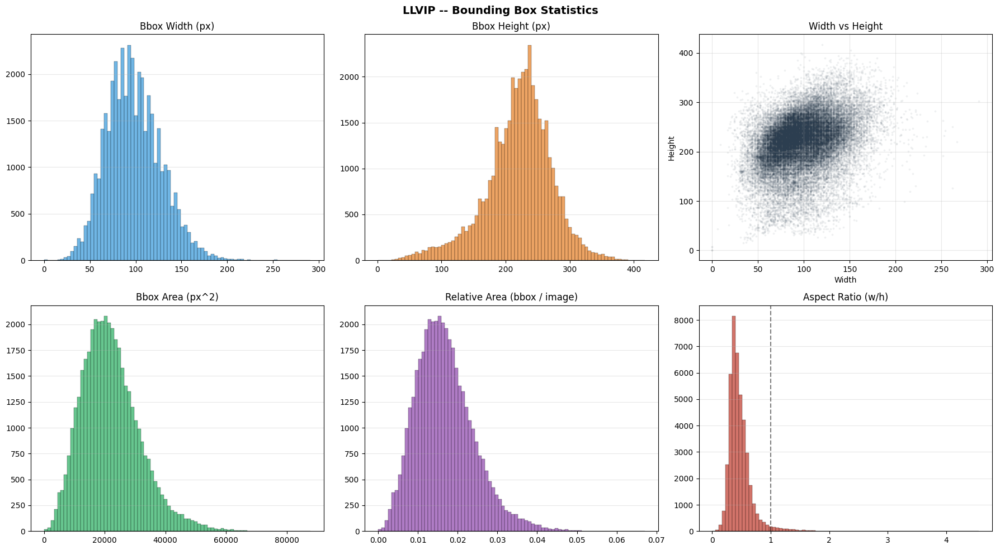


Bbox size stats (person):
         bbox_w    bbox_h      area  rel_area  aspect_ratio
count  42437.00  42437.00  42437.00  42437.00      42437.00
mean      98.03    220.19  22065.76      0.02          0.47
std       29.61     51.65   9658.25      0.01          0.22
min        0.00      1.00      0.00      0.00          0.00
25%       77.00    192.00  15225.00      0.01          0.35
50%       96.00    225.00  20995.00      0.02          0.43
75%      117.00    253.00  27694.00      0.02          0.54
max      291.00    417.00  87882.00      0.07          4.56


In [5]:
df_person['area'] = df_person['bbox_w'] * df_person['bbox_h']
df_person['rel_area'] = df_person['area'] / (df_person['img_w'] * df_person['img_h'])
df_person['aspect_ratio'] = df_person['bbox_w'] / df_person['bbox_h'].clip(lower=1)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Row 1: bbox width, height, scatter
axes[0, 0].hist(df_person['bbox_w'], bins=80, alpha=0.7, color='#3498db', edgecolor='black', linewidth=0.3)
axes[0, 0].set_title('Bbox Width (px)'); axes[0, 0].grid(axis='y', alpha=0.3)

axes[0, 1].hist(df_person['bbox_h'], bins=80, alpha=0.7, color='#e67e22', edgecolor='black', linewidth=0.3)
axes[0, 1].set_title('Bbox Height (px)'); axes[0, 1].grid(axis='y', alpha=0.3)

axes[0, 2].scatter(df_person['bbox_w'], df_person['bbox_h'], alpha=0.05, s=3, c='#2c3e50')
axes[0, 2].set_title('Width vs Height')
axes[0, 2].set_xlabel('Width'); axes[0, 2].set_ylabel('Height'); axes[0, 2].grid(alpha=0.3)

# Row 2: area, relative area, aspect ratio
axes[1, 0].hist(df_person['area'], bins=80, alpha=0.7, color='#27ae60', edgecolor='black', linewidth=0.3)
axes[1, 0].set_title('Bbox Area (px^2)'); axes[1, 0].grid(axis='y', alpha=0.3)

axes[1, 1].hist(df_person['rel_area'], bins=80, alpha=0.7, color='#8e44ad', edgecolor='black', linewidth=0.3)
axes[1, 1].set_title('Relative Area (bbox / image)'); axes[1, 1].grid(axis='y', alpha=0.3)

axes[1, 2].hist(df_person['aspect_ratio'], bins=80, alpha=0.7, color='#c0392b', edgecolor='black', linewidth=0.3)
axes[1, 2].set_title('Aspect Ratio (w/h)'); axes[1, 2].grid(axis='y', alpha=0.3)
axes[1, 2].axvline(1.0, color='black', linestyle='--', alpha=0.5)

plt.suptitle('LLVIP -- Bounding Box Statistics', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('\nBbox size stats (person):')
print(df_person[['bbox_w', 'bbox_h', 'area', 'rel_area', 'aspect_ratio']].describe().round(2))

## 6. Bbox Center Heatmap

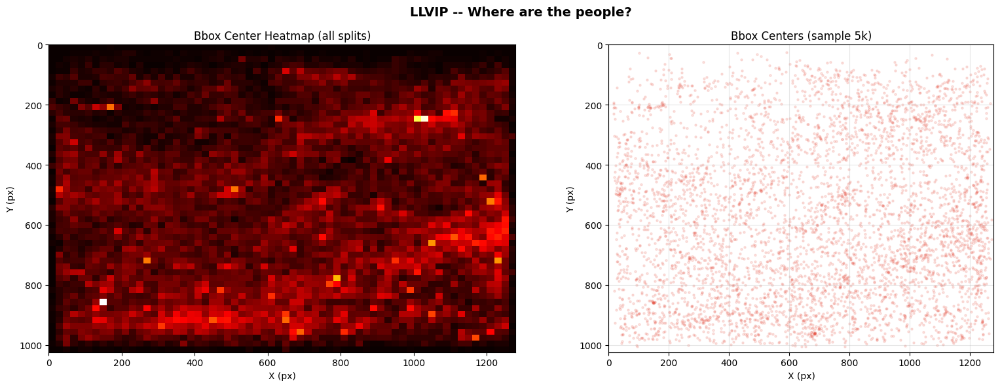

In [6]:
df_person['cx'] = (df_person['xmin'] + df_person['xmax']) / 2
df_person['cy'] = (df_person['ymin'] + df_person['ymax']) / 2

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of bbox centers
heatmap, xedges, yedges = np.histogram2d(
    df_person['cx'], df_person['cy'],
    bins=[64, 52], range=[[0, 1280], [0, 1024]]
)
axes[0].imshow(heatmap.T, origin='upper', aspect='auto',
               extent=[0, 1280, 1024, 0], cmap='hot')
axes[0].set_title('Bbox Center Heatmap (all splits)', fontsize=12)
axes[0].set_xlabel('X (px)'); axes[0].set_ylabel('Y (px)')

# Scatter of bbox centers (subsample for visibility)
sample = df_person.sample(min(5000, len(df_person)), random_state=42)
axes[1].scatter(sample['cx'], sample['cy'], alpha=0.15, s=5, c='#e74c3c')
axes[1].set_xlim(0, 1280); axes[1].set_ylim(1024, 0)
axes[1].set_title('Bbox Centers (sample 5k)', fontsize=12)
axes[1].set_xlabel('X (px)'); axes[1].set_ylabel('Y (px)')
axes[1].set_aspect('equal'); axes[1].grid(alpha=0.3)

plt.suptitle('LLVIP -- Where are the people?', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 7. Small / Medium / Large Object Distribution

Theo COCO standard:
- Small: area < 32x32 = 1024 px^2
- Medium: 1024 <= area < 96x96 = 9216 px^2
- Large: area >= 9216 px^2

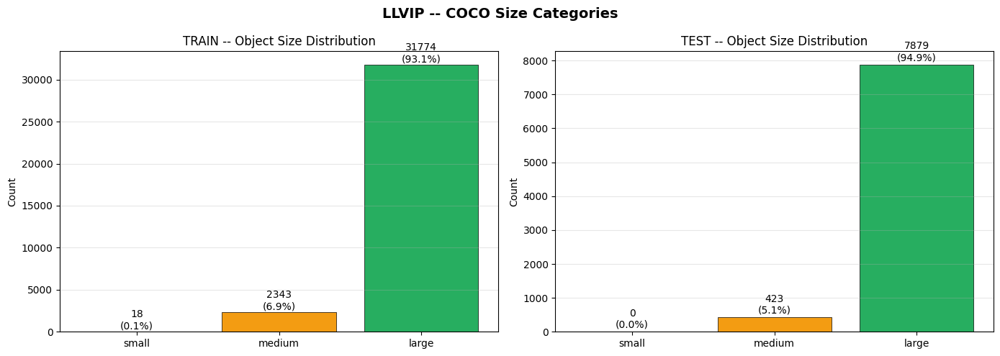


Size distribution:
size_cat  large  medium  small
split                         
test       7879     423      0
train     31774    2343     18


In [7]:
def size_category(area):
    if area < 1024:
        return 'small'
    elif area < 9216:
        return 'medium'
    else:
        return 'large'

df_person['size_cat'] = df_person['area'].apply(size_category)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

colors = {'small': '#e74c3c', 'medium': '#f39c12', 'large': '#27ae60'}

for ax, split in zip(axes, ['train', 'test']):
    subset = df_person[df_person['split'] == split]
    counts = subset['size_cat'].value_counts().reindex(['small', 'medium', 'large'], fill_value=0)
    bars = ax.bar(counts.index, counts.values,
                  color=[colors[c] for c in counts.index], edgecolor='black', linewidth=0.5)
    ax.set_title(f'{split.upper()} -- Object Size Distribution', fontsize=12)
    ax.set_ylabel('Count'); ax.grid(axis='y', alpha=0.3)
    for bar, val in zip(bars, counts.values):
        pct = val / len(subset) * 100
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50,
                f'{val}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=10)

plt.suptitle('LLVIP -- COCO Size Categories', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('\nSize distribution:')
print(df_person.groupby(['split', 'size_cat']).size().unstack(fill_value=0))

## 8. Sample Visible + Infrared Pairs

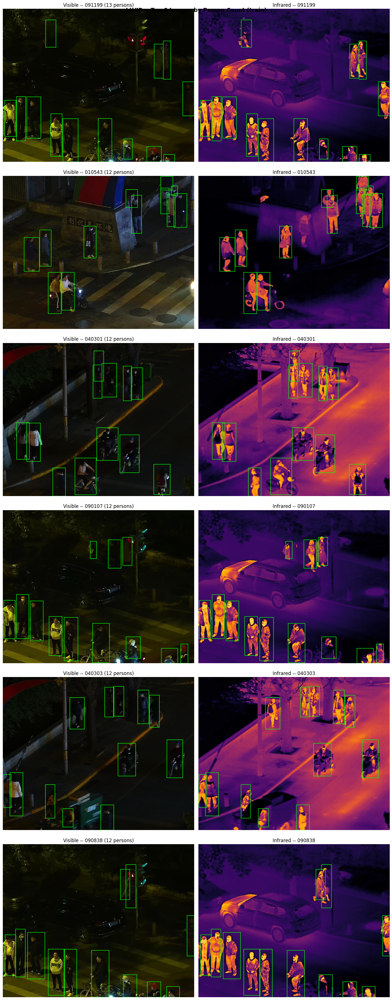

In [8]:
# Lay 6 sample tu train co nhieu bbox nhat
top_stems = (df_person[df_person['split'] == 'train']
             .groupby('stem').size()
             .sort_values(ascending=False)
             .head(6).index.tolist())

fig, axes = plt.subplots(6, 2, figsize=(14, 6 * 6))

for row, stem in enumerate(top_stems):
    vis_path = os.path.join(VIS_TRAIN, f'{stem}.jpg')
    ir_path  = os.path.join(IR_TRAIN, f'{stem}.jpg')

    vis = cv2.cvtColor(cv2.imread(vis_path), cv2.COLOR_BGR2RGB)
    ir  = cv2.imread(ir_path, cv2.IMREAD_GRAYSCALE)
    ir_c = cv2.cvtColor(cv2.applyColorMap(ir, cv2.COLORMAP_INFERNO), cv2.COLOR_BGR2RGB)

    objs = df_person[df_person['stem'] == stem]
    for _, o in objs.iterrows():
        x1, y1, x2, y2 = int(o['xmin']), int(o['ymin']), int(o['xmax']), int(o['ymax'])
        cv2.rectangle(vis,  (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.rectangle(ir_c, (x1, y1), (x2, y2), (0, 255, 0), 2)

    axes[row, 0].imshow(vis);  axes[row, 0].set_title(f'Visible -- {stem} ({len(objs)} persons)'); axes[row, 0].axis('off')
    axes[row, 1].imshow(ir_c); axes[row, 1].set_title(f'Infrared -- {stem}'); axes[row, 1].axis('off')

plt.suptitle('LLVIP -- Top-6 Images by Person Count (train)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 9. Random Samples (Train + Test)

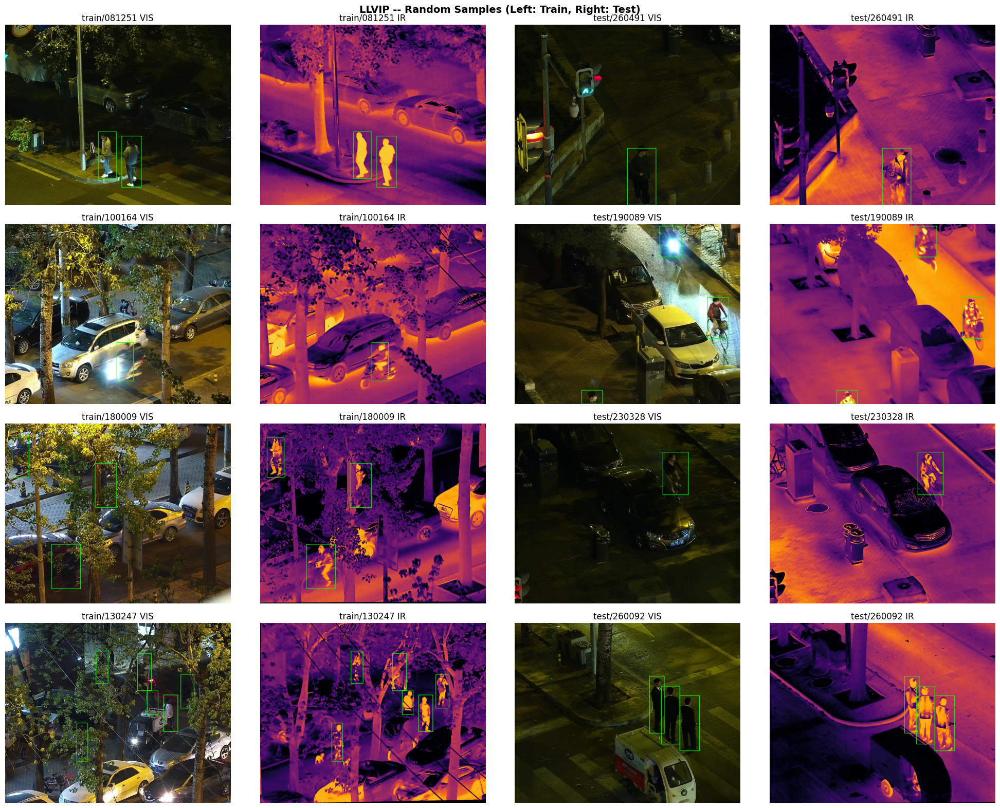

In [9]:
np.random.seed(42)

fig, axes = plt.subplots(4, 4, figsize=(20, 16))

for col_offset, (split, vis_dir, ir_dir) in enumerate([
    ('train', VIS_TRAIN, IR_TRAIN),
    ('test',  VIS_TEST,  IR_TEST)
]):
    split_stems = list(df_person[df_person['split'] == split]['stem'].unique())
    samples = np.random.choice(split_stems, size=4, replace=False)

    for row, stem in enumerate(samples):
        vis = cv2.cvtColor(cv2.imread(os.path.join(vis_dir, f'{stem}.jpg')), cv2.COLOR_BGR2RGB)
        ir  = cv2.imread(os.path.join(ir_dir, f'{stem}.jpg'), cv2.IMREAD_GRAYSCALE)
        ir_c = cv2.cvtColor(cv2.applyColorMap(ir, cv2.COLORMAP_INFERNO), cv2.COLOR_BGR2RGB)

        objs = df_person[df_person['stem'] == stem]
        for _, o in objs.iterrows():
            x1, y1, x2, y2 = int(o['xmin']), int(o['ymin']), int(o['xmax']), int(o['ymax'])
            cv2.rectangle(vis, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.rectangle(ir_c, (x1, y1), (x2, y2), (0, 255, 0), 2)

        c0 = col_offset * 2
        axes[row, c0].imshow(vis);    axes[row, c0].set_title(f'{split}/{stem} VIS');  axes[row, c0].axis('off')
        axes[row, c0+1].imshow(ir_c); axes[row, c0+1].set_title(f'{split}/{stem} IR'); axes[row, c0+1].axis('off')

plt.suptitle('LLVIP -- Random Samples (Left: Train, Right: Test)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 10. Pixel Intensity Distribution (Infrared vs Visible)

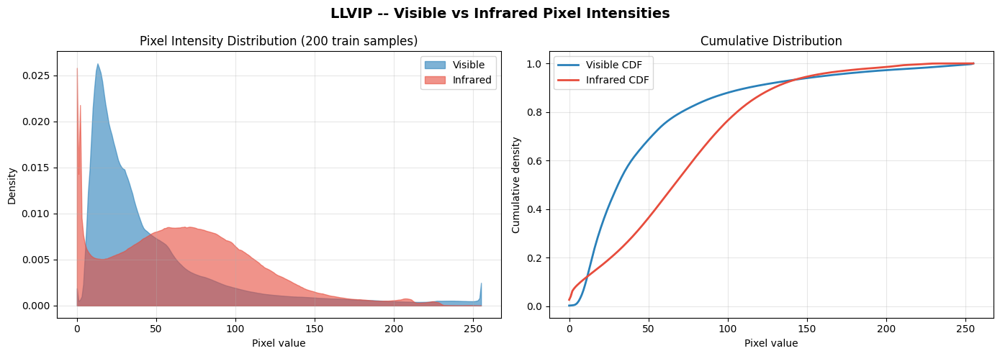

In [10]:
# Sample 200 images to compute pixel intensity histograms
np.random.seed(123)
sample_stems = np.random.choice(list(train_stems), size=min(200, len(train_stems)), replace=False)

vis_hist = np.zeros(256, dtype=np.float64)
ir_hist  = np.zeros(256, dtype=np.float64)

for stem in sample_stems:
    vis = cv2.imread(os.path.join(VIS_TRAIN, f'{stem}.jpg'), cv2.IMREAD_GRAYSCALE)
    ir  = cv2.imread(os.path.join(IR_TRAIN, f'{stem}.jpg'), cv2.IMREAD_GRAYSCALE)
    if vis is not None:
        h, _ = np.histogram(vis.ravel(), bins=256, range=(0, 256))
        vis_hist += h
    if ir is not None:
        h, _ = np.histogram(ir.ravel(), bins=256, range=(0, 256))
        ir_hist += h

# Normalize
vis_hist /= vis_hist.sum()
ir_hist  /= ir_hist.sum()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].fill_between(range(256), vis_hist, alpha=0.6, color='#2980b9', label='Visible')
axes[0].fill_between(range(256), ir_hist, alpha=0.6, color='#e74c3c', label='Infrared')
axes[0].set_title('Pixel Intensity Distribution (200 train samples)', fontsize=12)
axes[0].set_xlabel('Pixel value'); axes[0].set_ylabel('Density')
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(range(256), np.cumsum(vis_hist), color='#2980b9', linewidth=2, label='Visible CDF')
axes[1].plot(range(256), np.cumsum(ir_hist), color='#e74c3c', linewidth=2, label='Infrared CDF')
axes[1].set_title('Cumulative Distribution', fontsize=12)
axes[1].set_xlabel('Pixel value'); axes[1].set_ylabel('Cumulative density')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle('LLVIP -- Visible vs Infrared Pixel Intensities', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 11. Difficult Flag Analysis

In [11]:
diff_counts = df_person.groupby(['split', 'difficult']).size().unstack(fill_value=0)
print('Difficult flag distribution:')
print(diff_counts)
print()

n_diff = df_person['difficult'].sum()
print(f'Total difficult=1: {n_diff} / {len(df_person)} ({n_diff/len(df_person)*100:.2f}%)')

Difficult flag distribution:
difficult      0
split           
test        8302
train      34135

Total difficult=1: 0 / 42437 (0.00%)


## 12. Summary

| Metric | Value |
|--------|-------|
| Total pairs | 15,488 |
| Train / Test | 12,025 / 3,463 |
| Image size | 1280 x 1024 |
| Classes | person |
| Annotation format | VOC XML |
| Paired modalities | Visible (RGB) + Infrared (Thermal) |

**Key observations:**
- LLVIP la dataset ban dem / low-light, nguoi duoc chup tu camera co dinh (street-level)
- Infrared cho contrast cao hon visible trong dieu kien thieu sang
- Bbox size da dang: co ca small (xa) va large (gan)
- Dataset lon (15k+ pairs) -> phu hop de pretrain thermal backbone

## 13. Comment / Nhan xet

**Dataset:**
- LLVIP gom 15,488 cap anh (visible + infrared), 1280x1024, chi co 1 class: **person**.
- Train: 12,025 pairs (34,135 boxes) | Test: 3,463 pairs (8,302 boxes).
- Trung binh 2.74 nguoi/anh. Chi co 2 anh train khong co person annotation.
- 100% bbox deu khong danh dau difficult.

**Dac diem anh:**
- LLVIP la dataset **ban dem / low-light**, chup tu camera co dinh (street-level, via he, duong pho).
- Anh visible rat toi (phan lon pixel < 50), rat kho nhan dien bang mat thuong.
- Anh infrared cho **contrast cao**, nguoi noi bat ro tren nen toi -- day la ly do chinh dung LLVIP de pretrain thermal backbone.

**Bbox analysis:**
- Phan lon bbox la **medium va large** (nguoi dung gan camera, goc nhin ngang).
- Aspect ratio < 1 (nguoi cao hon rong) -- phu hop voi nguoi dung/di bo.
- Bbox center tap trung o **giua-duoi frame** (vi tri via he, duong di).
- It bbox **small** (nguoi o xa) -- khac voi drone dataset (nhieu small object).

**So sanh voi drone use-case:**
- LLVIP chup goc ngang (street-level) != goc nhin drone (top-down/oblique).
- Tuy nhien, thermal features (nguoi phat nhiet, noi bat tren nen) la **domain-agnostic** -- backbone hoc duoc tu LLVIP van transfer tot sang drone thermal.
- Khi finetune tren RGBTDronePerson (co goc drone), model se adapt lai bbox size va viewpoint.

**Ket luan:**
- LLVIP phu hop de pretrain thermal backbone vi: dataset lon (15k+ pairs), annotation sach, infrared contrast tot.
- Sau pretrain, backbone se duoc **freeze** va ghep voi RGB backbone (SeaDronesSee) trong mid-level fusion pipeline.